## Part 4 — Pose / Tracking Debug (for a specific video)

מטרה: להבין *למה* ה־AR "לא עומד" על המישור.

המחברת הזו עושה דיבאג בשלבים:
1. טעינת וידאו + רפרנס + קליברציה
2. (אופציונלי) טרקינג על פריים מוקטן כדי שלא יתקע
3. Matching visualization
4. Homography overlay (warp של הרפרנס על הפריים)
5. ציור 4 הפינות
6. solvePnP (אפשר לבחור וריאנט) + **reprojection error** (הבדל בין corners לבין projectPoints של המישור)
7. ציור צירים (X/Y/Z) כדי לראות אוריינטציה

רק משנים בתא הראשון:
- `video_path`
- `reference_path`
- `calib_path`
- `windows_s`



In [1]:
import cv2
import numpy as np

try:
    import matplotlib.pyplot as plt
except Exception as e:
    raise RuntimeError("matplotlib is required for this notebook. Install: pip install matplotlib") from e

from config import Part1Config
from tracker import PlanarTracker
from camera import load_calibration_npz
from ar_render import scale_K_to_new_size, make_plane_object_points

# =========================
# CONFIG (edit here)
# =========================
video_path = "data/part4_occlusion_hand.mp4"
reference_path = "data/part4_reference.JPG"   # or "data/part4_reference.JPG"
calib_path = "outputs/camera/calibration.npz"

# Video ends at ~30s → keep windows inside range
windows_s = [
    (6.2, 8.25),
    (19.0, 21.0),
]

# Tracking speedup (recommended on 1080p/1920p)
use_resize_for_tracking = True
track_scale = 0.60   # 0.5–0.8 typical. Smaller = faster.

# solvePnP variant
pnp_variant = "ITERATIVE"  # "ITERATIVE" / "IPPE" / "EPNP" / "AP3P"

# Plane scale
plane_width = 1.0

print("video_path:", video_path)
print("reference_path:", reference_path)
print("calib_path:", calib_path)



video_path: data/part4_occlusion_hand.mp4
reference_path: data/part4_reference.JPG
calib_path: outputs/camera/calibration.npz


In [2]:
def bgr_to_rgb(img_bgr: np.ndarray) -> np.ndarray:
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)


def show_rgb(img_bgr: np.ndarray, title: str = "", figsize=(12, 7)):
    plt.figure(figsize=figsize)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.imshow(bgr_to_rgb(img_bgr))
    plt.show()


def get_frame_at_time(cap: cv2.VideoCapture, t_s: float) -> np.ndarray:
    cap.set(cv2.CAP_PROP_POS_MSEC, float(t_s) * 1000.0)
    ok, fr = cap.read()
    if not ok or fr is None:
        raise RuntimeError(f"Failed to read frame at t={t_s:.3f}s")
    return fr


def build_probe_times(windows):
    ts = []
    for (t0, t1) in windows:
        ts.extend([float(t0), 0.5 * (float(t0) + float(t1)), float(t1)])
    return ts


def resize_for_tracking(frame_bgr: np.ndarray, scale: float):
    s = float(scale)
    if not (0.0 < s < 1.0):
        return frame_bgr, 1.0
    h, w = frame_bgr.shape[:2]
    fr = cv2.resize(frame_bgr, (int(w * s), int(h * s)), interpolation=cv2.INTER_AREA)
    return fr, s


def lift_H_to_fullres(H_ref_to_small: np.ndarray, scale: float) -> np.ndarray:
    # small coords = scale * full coords
    s = float(scale)
    if abs(s - 1.0) < 1e-9:
        return H_ref_to_small
    S_inv = np.array([[1.0 / s, 0.0, 0.0], [0.0, 1.0 / s, 0.0], [0.0, 0.0, 1.0]], dtype=np.float64)
    return S_inv @ np.asarray(H_ref_to_small, dtype=np.float64)


def draw_quad(img_bgr: np.ndarray, corners, color=(0, 255, 0), thick=4) -> np.ndarray:
    out = img_bgr.copy()
    if corners is None:
        cv2.putText(out, "NO CORNERS", (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)
        return out
    pts = np.asarray(corners, dtype=np.float32).reshape(4, 2)
    if not np.isfinite(pts).all():
        cv2.putText(out, "BAD CORNERS", (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)
        return out
    cv2.polylines(out, [pts.astype(int)], True, color, thick)
    for (x, y) in pts:
        cv2.circle(out, (int(x), int(y)), 7, (0, 0, 255), -1)
    return out


def overlay_warp(frame_bgr: np.ndarray, ref_bgr: np.ndarray, H_ref_to_frame: np.ndarray, alpha: float = 0.6):
    h, w = frame_bgr.shape[:2]
    warped = cv2.warpPerspective(ref_bgr, H_ref_to_frame, (w, h))
    ones = np.ones(ref_bgr.shape[:2], dtype=np.uint8) * 255
    mask = cv2.warpPerspective(ones, H_ref_to_frame, (w, h))
    out = frame_bgr.copy()
    m = (mask > 0)
    out[m] = (alpha * warped[m] + (1.0 - alpha) * frame_bgr[m]).astype(np.uint8)
    return warped, mask, out


def pnp_flag(name: str) -> int:
    n = str(name).strip().upper()
    if n == "IPPE" and hasattr(cv2, "SOLVEPNP_IPPE"):
        return int(cv2.SOLVEPNP_IPPE)
    if n == "AP3P" and hasattr(cv2, "SOLVEPNP_AP3P"):
        return int(cv2.SOLVEPNP_AP3P)
    if n == "EPNP" and hasattr(cv2, "SOLVEPNP_EPNP"):
        return int(cv2.SOLVEPNP_EPNP)
    return int(cv2.SOLVEPNP_ITERATIVE)


def reprojection_error(obj_pts3d: np.ndarray, img_pts2d: np.ndarray, rvec, tvec, K, dist) -> float:
    proj, _ = cv2.projectPoints(obj_pts3d, rvec, tvec, K, dist)
    proj = proj.reshape(-1, 2)
    err = np.linalg.norm(proj - img_pts2d.reshape(-1, 2), axis=1)
    return float(np.mean(err))


def draw_reprojected_plane(img_bgr: np.ndarray, obj_pts3d: np.ndarray, rvec, tvec, K, dist) -> np.ndarray:
    pts2d, _ = cv2.projectPoints(obj_pts3d, rvec, tvec, K, dist)
    pts2d = pts2d.reshape(-1, 2)
    out = img_bgr.copy()
    cv2.polylines(out, [np.int32(pts2d)], True, (255, 255, 0), 3)
    for (x, y) in pts2d:
        cv2.circle(out, (int(x), int(y)), 6, (255, 255, 0), -1)
    return out


def draw_axes(img_bgr: np.ndarray, rvec, tvec, K, dist, axis_len: float):
    pts3d = np.array(
        [[0.0, 0.0, 0.0], [axis_len, 0.0, 0.0], [0.0, axis_len, 0.0], [0.0, 0.0, -axis_len]],
        dtype=np.float64,
    )
    pts2d, _ = cv2.projectPoints(pts3d, rvec, tvec, K, dist)
    pts2d = pts2d.reshape(-1, 2)
    o, x, y, z = [tuple(np.int32(p)) for p in pts2d]

    out = img_bgr.copy()
    cv2.line(out, o, x, (0, 0, 255), 4)
    cv2.line(out, o, y, (0, 255, 0), 4)
    cv2.line(out, o, z, (255, 0, 0), 4)
    return out



In [3]:
# Load video
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    raise FileNotFoundError(f"Could not open video: {video_path}")

fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print("fps=", fps, "size=", (W, H))

# Load reference + tracker
ref_bgr = cv2.imread(reference_path)
if ref_bgr is None:
    raise FileNotFoundError(f"Could not read reference: {reference_path}")

tracker_cfg = Part1Config()
tracker = PlanarTracker(ref_bgr, tracker_cfg)

# Load calibration + scale K
calib = load_calibration_npz(calib_path)
K_calib = np.asarray(calib.K, dtype=np.float64).reshape(3, 3)
dist = np.asarray(calib.dist, dtype=np.float64).reshape(-1, 1)

K = K_calib
if tuple(calib.image_size) != (W, H):
    K = scale_K_to_new_size(K_calib, tuple(calib.image_size), (W, H))
K = np.asarray(K, dtype=np.float64).reshape(3, 3)

# Plane object points
ref_h, ref_w = ref_bgr.shape[:2]
ref_aspect = ref_h / float(ref_w)
plane_w = float(plane_width)
plane_h = float(plane_width) * ref_aspect
obj_plane = np.ascontiguousarray(make_plane_object_points(plane_w, plane_h), dtype=np.float64).reshape(-1, 3)

probe_times = build_probe_times(windows_s)
print("probe_times:", probe_times)
print("ref size (w,h):", (ref_w, ref_h), "aspect:", ref_aspect)
print("calib image_size (w,h):", tuple(calib.image_size))
print("K used:\n", K)



fps= 30.00156748001463 size= (1080, 1920)
probe_times: [6.2, 7.225, 8.25, 19.0, 20.0, 21.0]
ref size (w,h): (654, 879) aspect: 1.3440366972477065
calib image_size (w,h): (4284, 5712)
K used:
 [[1.02087237e+03 0.00000000e+00 5.38220019e+02]
 [0.00000000e+00 1.36038846e+03 9.58303200e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


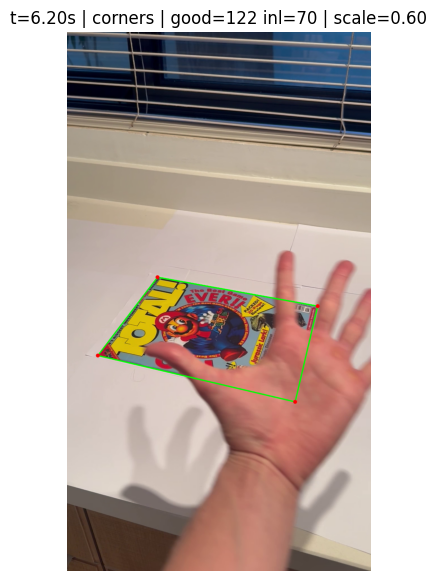

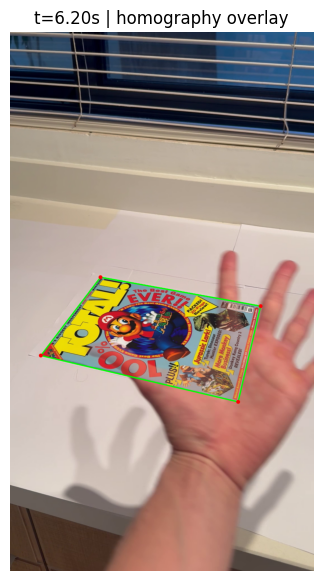

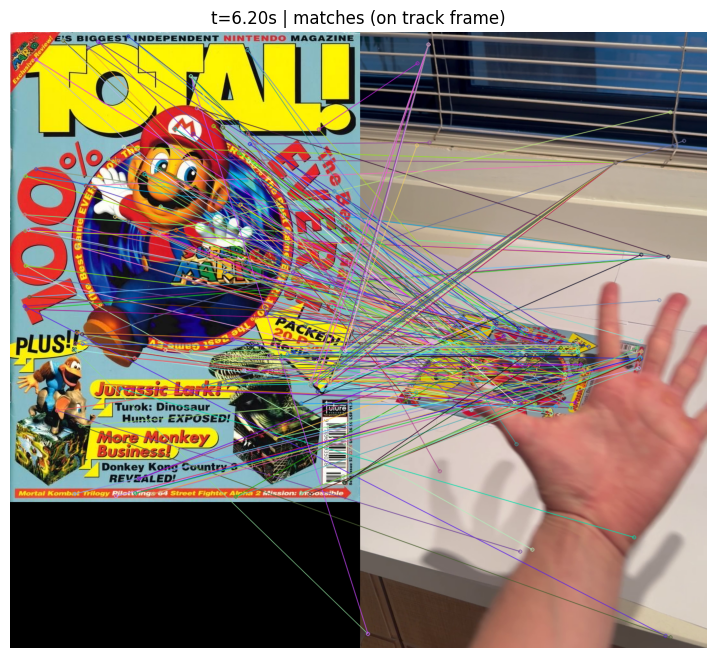

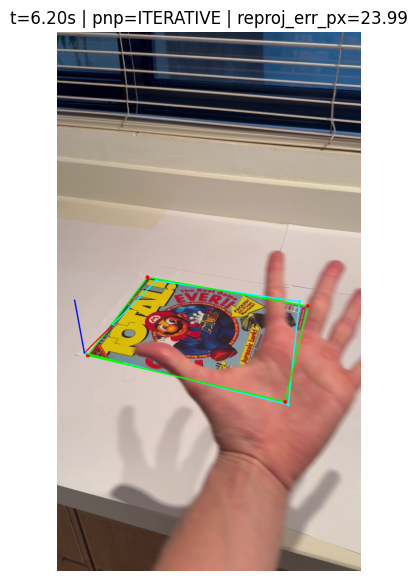

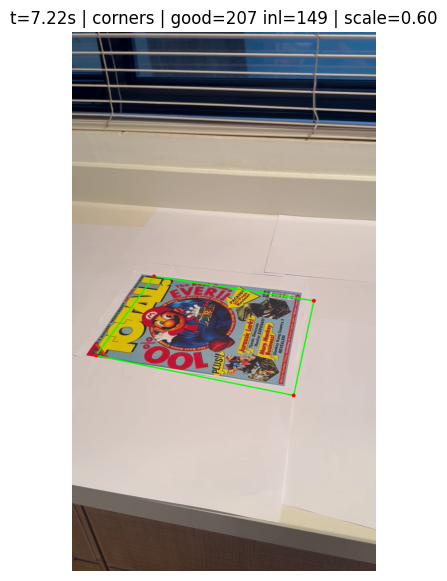

...

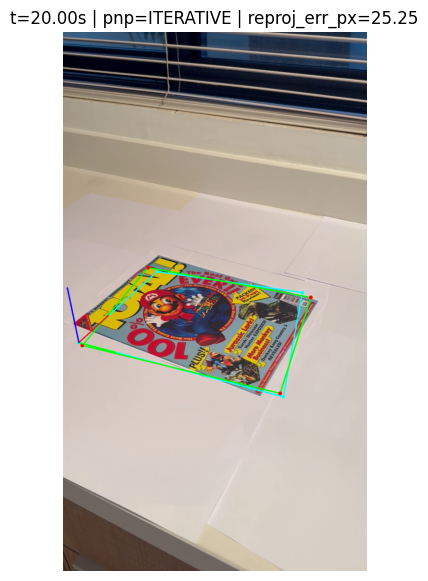

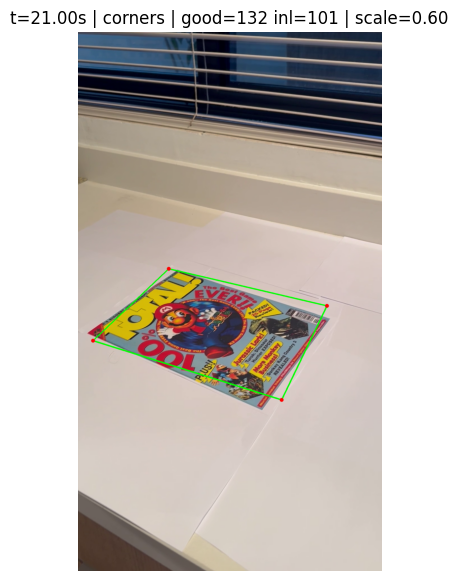

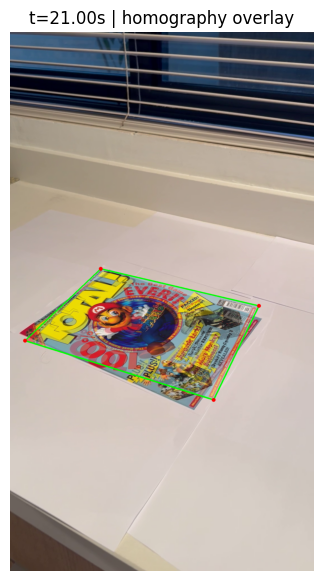

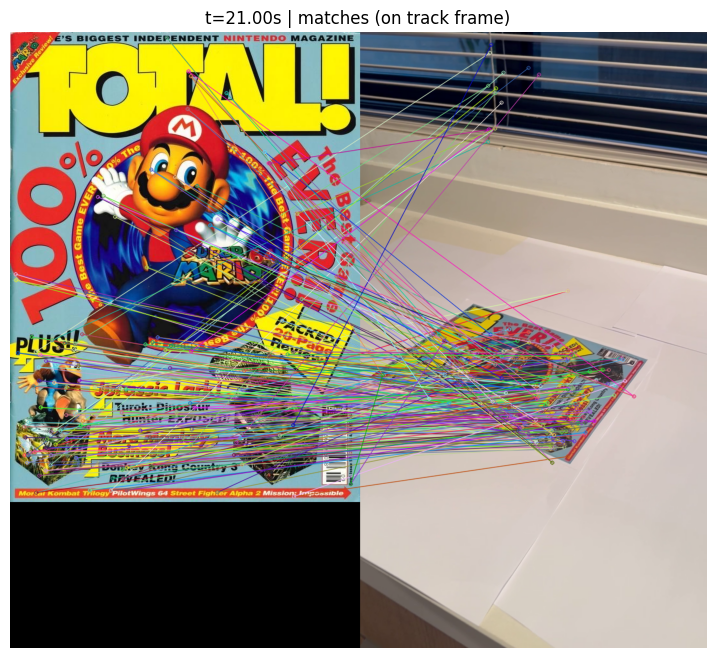

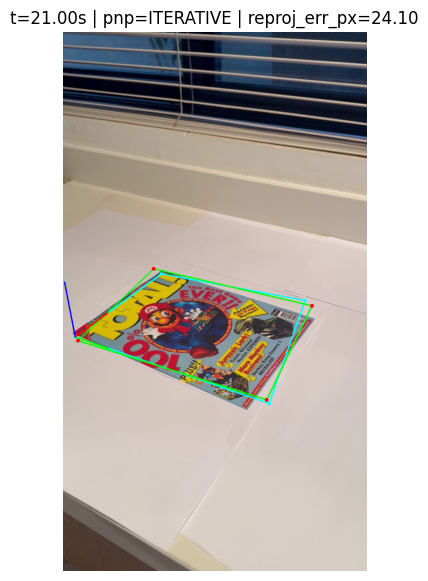

In [4]:
# Debug each probe time
for t in probe_times:
    frame_full = get_frame_at_time(cap, t)

    frame_track = frame_full
    scale = 1.0
    if use_resize_for_tracking:
        frame_track, scale = resize_for_tracking(frame_full, track_scale)

    # Track + get matches
    Hs, corners_s, dbg, extra = tracker.track_debug(frame_track)

    H_full = None
    corners_full = None
    if Hs is not None:
        H_full = lift_H_to_fullres(Hs, scale)
    if corners_s is not None:
        corners_full = (np.asarray(corners_s, dtype=np.float64) / float(scale)).astype(np.float32)

    # 1) corners
    vis_corners = draw_quad(frame_full, corners_full)
    show_rgb(vis_corners, title=f"t={t:.2f}s | corners | good={dbg.get('good',0)} inl={dbg.get('inliers',0)} | scale={scale:.2f}")

    # 2) homography overlay
    if H_full is not None:
        _warped, _mask, overlay = overlay_warp(frame_full, ref_bgr, H_full, alpha=0.55)
        overlay2 = draw_quad(overlay, corners_full)
        show_rgb(overlay2, title=f"t={t:.2f}s | homography overlay")

    # 3) matching visualization (optional, can be heavy)
    kp_fr = extra.get('kp_frame')
    good_pairs = extra.get('good_pairs')
    if kp_fr is not None and good_pairs is not None and len(good_pairs) > 0:
        matches_vis = cv2.drawMatchesKnn(
            ref_bgr,
            tracker.kp_ref,
            frame_track,
            kp_fr,
            good_pairs,
            None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        )
        show_rgb(matches_vis, title=f"t={t:.2f}s | matches (on track frame)", figsize=(18, 8))

    # 4) solvePnP + reprojection error
    if corners_full is not None:
        img_pts = np.asarray(corners_full, dtype=np.float64).reshape(-1, 2)
        try:
            ok_pnp, rvec, tvec = cv2.solvePnP(obj_plane, img_pts, K, dist, flags=pnp_flag(pnp_variant))
        except cv2.error:
            ok_pnp = False

        if ok_pnp:
            err = reprojection_error(obj_plane, img_pts, rvec, tvec, K, dist)
            vis = draw_reprojected_plane(frame_full, obj_plane, rvec, tvec, K, dist)
            vis = draw_quad(vis, corners_full, color=(0, 255, 0), thick=3)
            vis = draw_axes(vis, rvec, tvec, K, dist, axis_len=0.3 * plane_w)
            show_rgb(vis, title=f"t={t:.2f}s | pnp={pnp_variant} | reproj_err_px={err:.2f}")
        else:
            show_rgb(frame_full, title=f"t={t:.2f}s | solvePnP FAILED ({pnp_variant})")



## אלטרנטיבה בלי Homography: זיהוי המישור מקונטורים (קצוות)

כאן ננסה לזהות את המישור כך:
- Canny → Contours → לבחור מרובע גדול → לסדר פינות TL/TR/BR/BL
- ואז `solvePnP` על הפינות האלה

זה יכול לעבוד טוב אם למרקר יש **גבול מרובע ברור** (למשל מסגרת שחורה).



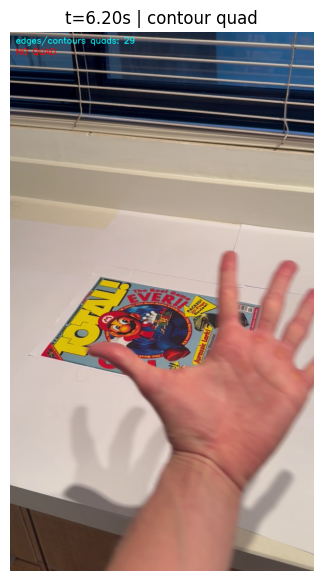

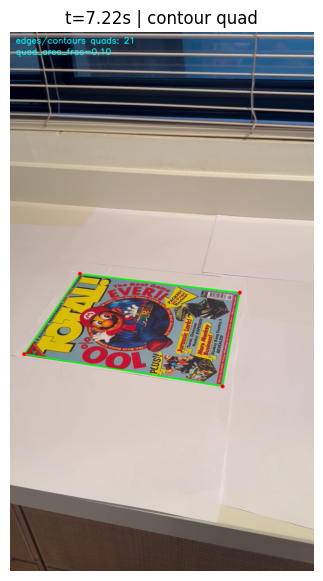

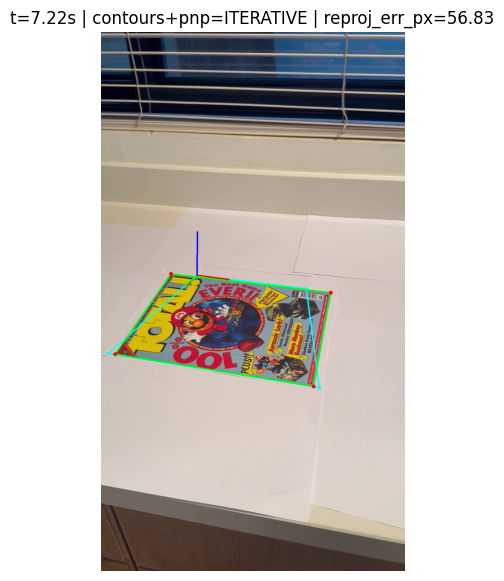

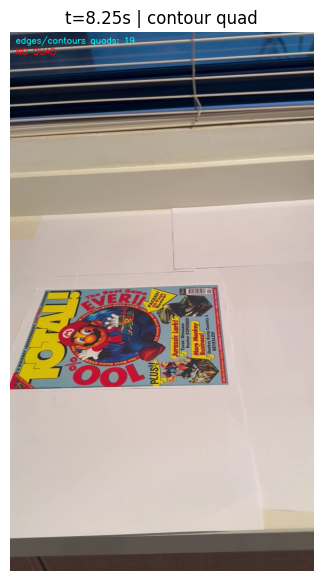

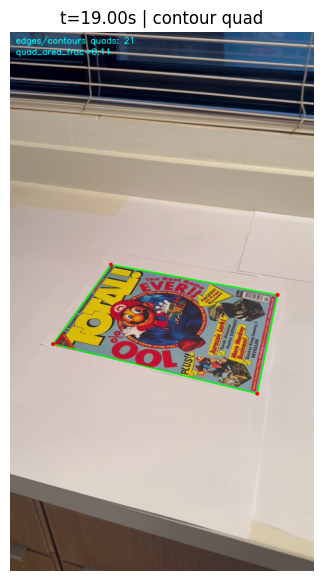

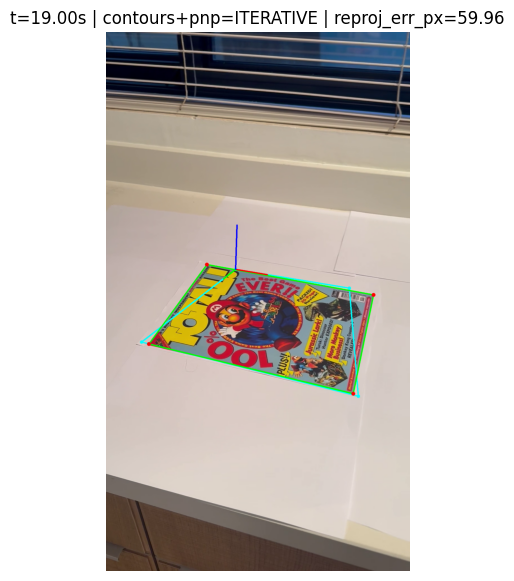

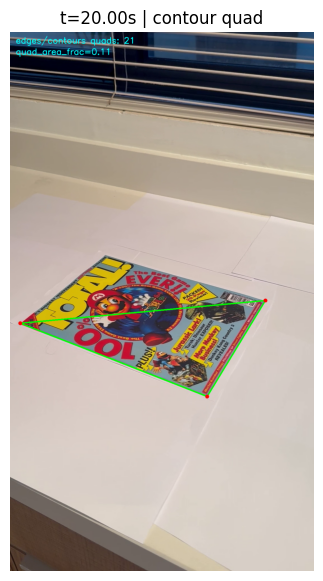

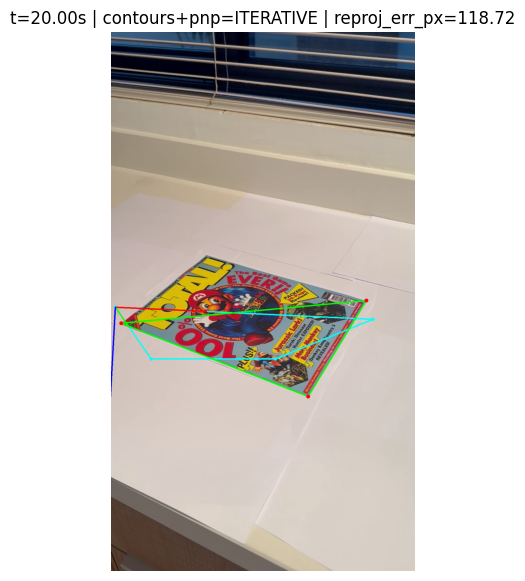

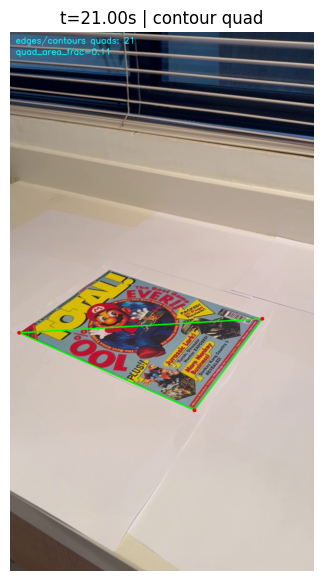

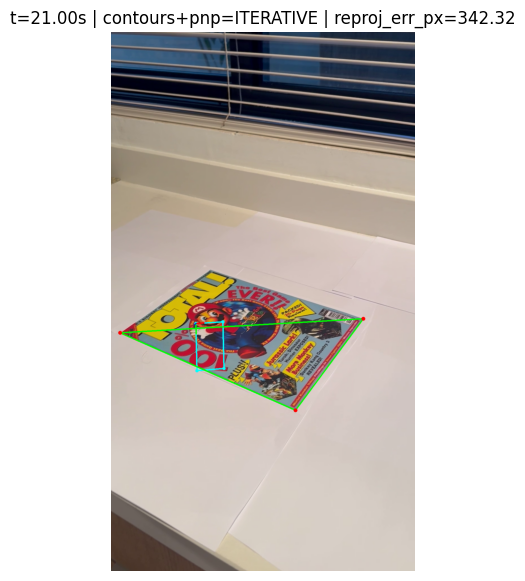

In [5]:
# ---- Contour-based quad detection params (tune if needed) ----
canny1, canny2 = 60, 160
blur_ksize = 5
approx_eps_frac = 0.02   # fraction of contour perimeter
min_area_frac = 0.08     # min quad area as fraction of image area


def order_points_tl_tr_br_bl(pts4_xy: np.ndarray) -> np.ndarray:
    """Return points ordered as TL, TR, BR, BL."""
    pts = np.asarray(pts4_xy, dtype=np.float64).reshape(4, 2)
    s = pts.sum(axis=1)
    d = pts[:, 0] - pts[:, 1]

    tl = pts[np.argmin(s)]
    br = pts[np.argmax(s)]
    tr = pts[np.argmax(d)]
    bl = pts[np.argmin(d)]
    return np.vstack([tl, tr, br, bl]).astype(np.float32)


def detect_quad_by_contours(frame_bgr: np.ndarray):
    """Return (corners4x2 float32, dbg_vis_bgr). corners in TL/TR/BR/BL or None."""
    h, w = frame_bgr.shape[:2]
    img_area = float(h * w)

    gray = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2GRAY)
    if int(blur_ksize) > 0:
        k = int(blur_ksize) | 1
        gray = cv2.GaussianBlur(gray, (k, k), 0)

    edges = cv2.Canny(gray, int(canny1), int(canny2))
    edges = cv2.dilate(edges, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)), iterations=1)

    cnts, _hier = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    best = None
    best_area = 0.0
    for c in cnts:
        area = float(cv2.contourArea(c))
        if area < float(min_area_frac) * img_area:
            continue

        peri = float(cv2.arcLength(c, True))
        eps = float(approx_eps_frac) * peri
        approx = cv2.approxPolyDP(c, eps, True)

        if len(approx) != 4:
            continue
        if not cv2.isContourConvex(approx):
            continue

        # keep the largest quad
        if area > best_area:
            best_area = area
            best = approx

    vis = frame_bgr.copy()
    cv2.putText(vis, f"edges/contours quads: {len(cnts)}", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 0), 2)

    if best is None:
        cv2.putText(vis, "NO QUAD", (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)
        return None, vis

    pts = best.reshape(4, 2)
    ordered = order_points_tl_tr_br_bl(pts)

    vis = draw_quad(vis, ordered)
    cv2.putText(vis, f"quad_area_frac={best_area / img_area:.2f}", (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 0), 2)
    return ordered, vis


# Run contour-based pose debug
for t in probe_times:
    frame = get_frame_at_time(cap, t)
    corners_c, vis_quad = detect_quad_by_contours(frame)
    show_rgb(vis_quad, title=f"t={t:.2f}s | contour quad")

    if corners_c is None:
        continue

    img_pts = np.asarray(corners_c, dtype=np.float64).reshape(-1, 2)
    try:
        ok_pnp, rvec, tvec = cv2.solvePnP(obj_plane, img_pts, K, dist, flags=pnp_flag(pnp_variant))
    except cv2.error:
        ok_pnp = False

    if not ok_pnp:
        show_rgb(frame, title=f"t={t:.2f}s | solvePnP FAILED (contours)")
        continue

    err = reprojection_error(obj_plane, img_pts, rvec, tvec, K, dist)
    vis = draw_reprojected_plane(frame, obj_plane, rvec, tvec, K, dist)
    vis = draw_quad(vis, corners_c, color=(0, 255, 0), thick=3)
    vis = draw_axes(vis, rvec, tvec, K, dist, axis_len=0.3 * plane_w)
    show_rgb(vis, title=f"t={t:.2f}s | contours+pnp={pnp_variant} | reproj_err_px={err:.2f}")



## הוספת אובייקט (AR) על המישור לפי ה‑pose

פה נרנדר מודל `.obj` על המישור לפי ה־pose שמגיע מ־`solvePnP`.
אפשר לבחור אם ה־pose מגיע מ:
- `tracker` (SIFT+Homography → corners)
- `contours` (Canny/Contours → corners)



AR mesh ready | verts: 169374 faces: 3000 pose_source: tracker


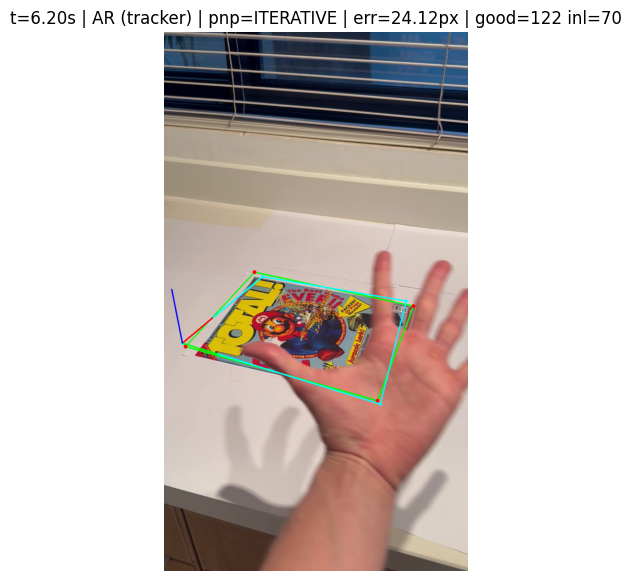

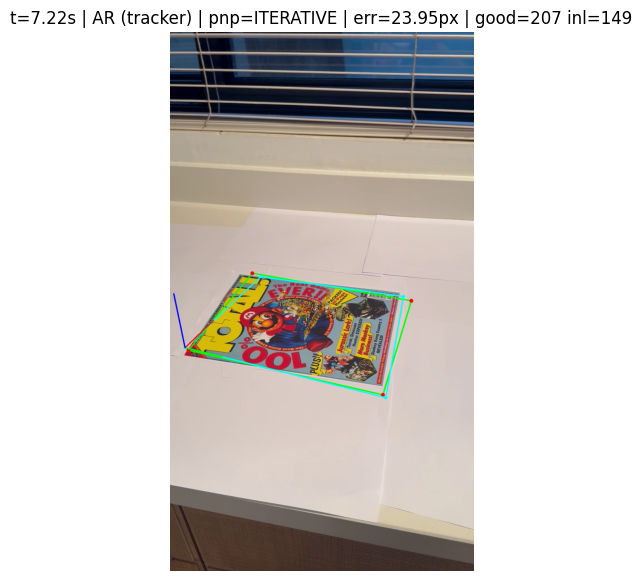

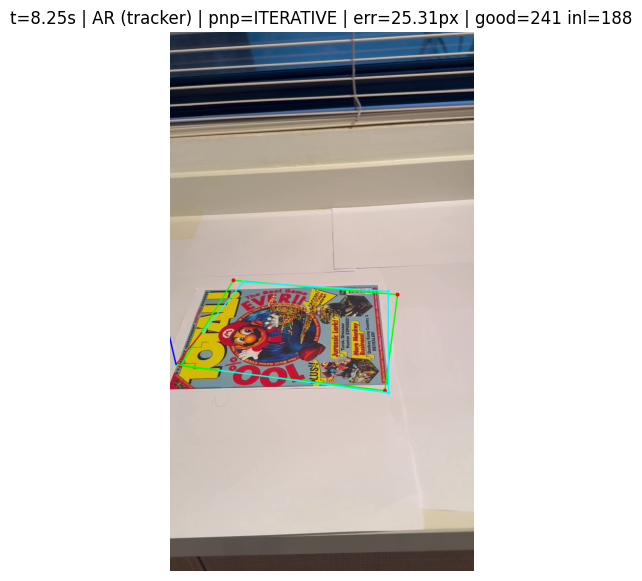

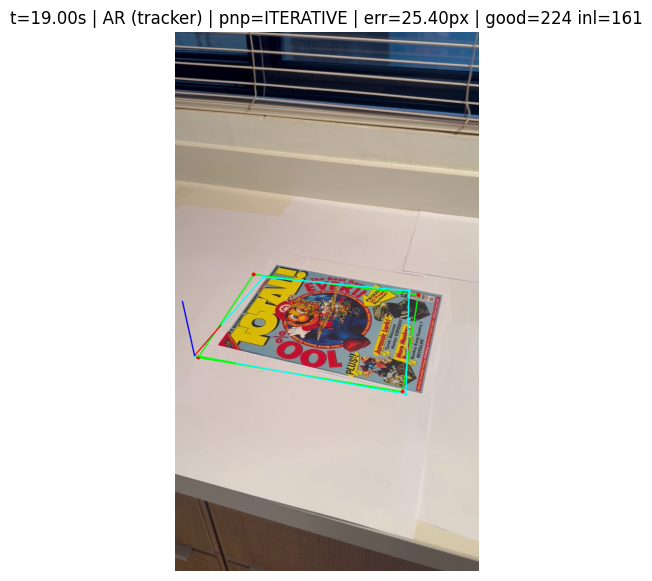

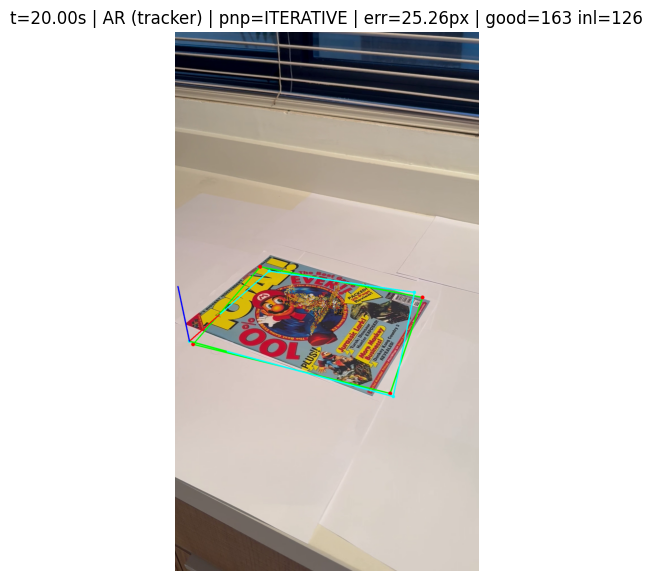

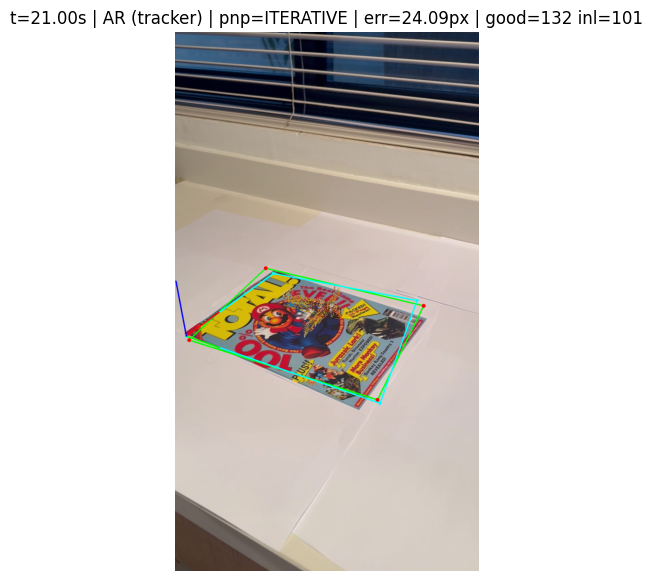

In [6]:
from ar_render import load_mesh_trimesh, transform_mesh_to_plane, draw_mesh_flat, draw_mesh_wireframe

# --------- AR config ----------
pose_source = "tracker"  # "tracker" or "contours"
model_path = "data/models/86jfmjiufzv2.obj"

# model placement (tune if needed)
model_scale_frac = 0.30
model_offset_x_frac = 0.55
model_offset_y_frac = 0.55
rotate_x_deg = 0.0
rotate_y_deg = 0.0
rotate_z_deg = 0.0
max_faces = 3000

# render mode
render_flat = True  # True=fill triangles, False=wireframe

# Prepare mesh-on-plane
v_mesh, f_mesh, face_colors = load_mesh_trimesh(model_path)

if max_faces and int(max_faces) > 0 and f_mesh.shape[0] > int(max_faces):
    rng = np.random.default_rng(0)
    idx = rng.choice(f_mesh.shape[0], size=int(max_faces), replace=False)
    f_mesh = f_mesh[idx]
    if face_colors is not None and face_colors.shape[0] >= idx.max() + 1:
        face_colors = face_colors[idx]

v_plane_mesh = transform_mesh_to_plane(
    v_mesh,
    plane_w=plane_w,
    plane_h=plane_h,
    scale_frac=model_scale_frac,
    offset_x_frac=model_offset_x_frac,
    offset_y_frac=model_offset_y_frac,
    z_up=True,
    rotate_x_deg=rotate_x_deg,
    rotate_y_deg=rotate_y_deg,
    rotate_z_deg=rotate_z_deg,
)

print("AR mesh ready | verts:", v_plane_mesh.shape[0], "faces:", f_mesh.shape[0], "pose_source:", pose_source)


def corners_from_tracker(frame_full: np.ndarray):
    frame_track = frame_full
    scale = 1.0
    if use_resize_for_tracking:
        frame_track, scale = resize_for_tracking(frame_full, track_scale)

    Hs, corners_s, dbg, extra = tracker.track_debug(frame_track)
    if corners_s is None:
        return None, dbg

    corners_full = (np.asarray(corners_s, dtype=np.float64) / float(scale)).astype(np.float32)
    return corners_full.reshape(4, 2), dbg


def corners_from_contours(frame_full: np.ndarray):
    corners_c, _vis = detect_quad_by_contours(frame_full)
    if corners_c is None:
        return None
    return corners_c.reshape(4, 2)


def render_model(frame_bgr: np.ndarray, rvec, tvec):
    proj, _ = cv2.projectPoints(v_plane_mesh, rvec, tvec, K, dist)
    verts2d = proj.reshape(-1, 2)

    # painter order (far->near)
    R, _ = cv2.Rodrigues(rvec)
    cam = (R @ v_plane_mesh.T + tvec).T
    z = cam[:, 2]
    face_depth = z[f_mesh].mean(axis=1)
    order = np.argsort(face_depth)[::-1]

    if render_flat and face_colors is not None:
        return draw_mesh_flat(frame_bgr, verts2d, f_mesh, face_colors, order=order)
    if render_flat and face_colors is None:
        # flat fallback
        return draw_mesh_flat(frame_bgr, verts2d, f_mesh, None, order=order)

    return draw_mesh_wireframe(frame_bgr, verts2d, f_mesh, color=(0, 255, 255), thickness=1)


for t in probe_times:
    frame = get_frame_at_time(cap, t)

    if pose_source.lower() == "tracker":
        corners4, dbg = corners_from_tracker(frame)
        dbg_txt = f"good={dbg.get('good',0)} inl={dbg.get('inliers',0)}"
    else:
        corners4 = corners_from_contours(frame)
        dbg_txt = "contours"

    if corners4 is None:
        show_rgb(frame, title=f"t={t:.2f}s | NO CORNERS ({pose_source})")
        continue

    img_pts = np.asarray(corners4, dtype=np.float64).reshape(-1, 2)

    try:
        ok_pnp, rvec, tvec = cv2.solvePnP(obj_plane, img_pts, K, dist, flags=pnp_flag(pnp_variant))
    except cv2.error:
        ok_pnp = False

    if not ok_pnp:
        show_rgb(frame, title=f"t={t:.2f}s | solvePnP FAILED ({pnp_variant})")
        continue

    err = reprojection_error(obj_plane, img_pts, rvec, tvec, K, dist)

    # Render model + draw quad + reprojection + axes
    out = render_model(frame, rvec, tvec)
    out = draw_quad(out, corners4, color=(0, 255, 0), thick=3)
    out = draw_reprojected_plane(out, obj_plane, rvec, tvec, K, dist)
    out = draw_axes(out, rvec, tvec, K, dist, axis_len=0.3 * plane_w)

    show_rgb(out, title=f"t={t:.2f}s | AR ({pose_source}) | pnp={pnp_variant} | err={err:.2f}px | {dbg_txt}")



## Batch check: בדיקה מהירה על ~40 פריימים

ניקח בערך 40 פריימים בתוך `windows_s`, נריץ טרקינג + PnP ונציג גריד קטן של התוצאות.

